In [ ]:
#import drive
from google.colab import drive
drive.mount('/content/drive')
#

Mounted at /content/drive


# preprocess, setup data structure

In [ ]:
%cd /content/drive/MyDrive/UFPR-AMR Dataset

/content/drive/.shortcut-targets-by-id/1JEBz44tAhyiWONi7OdtYCB9Hd3j-d5jf/UFPR-AMR Dataset


In [ ]:
%ls

README.txt  testing/  training/  validation/


In [ ]:
#cd and ls
%cd testing
%ls

[Errno 2] No such file or directory: 'testing'
/content/drive/MyDrive/UFPR-AMR Dataset/testing
meter1201.jpg  meter1334.txt  meter1468.jpg  meter1601.txt  meter1735.jpg  meter1868.txt
meter1201.txt  meter1335.jpg  meter1468.txt  meter1602.jpg  meter1735.txt  meter1869.jpg
meter1202.jpg  meter1335.txt  meter1469.jpg  meter1602.txt  meter1736.jpg  meter1869.txt
meter1202.txt  meter1336.jpg  meter1469.txt  meter1603.jpg  meter1736.txt  meter1870.jpg
meter1203.jpg  meter1336.txt  meter1470.jpg  meter1603.txt  meter1737.jpg  meter1870.txt
meter1203.txt  meter1337.jpg  meter1470.txt  meter1604.jpg  meter1737.txt  meter1871.jpg
meter1204.jpg  meter1337.txt  meter1471.jpg  meter1604.txt  meter1738.jpg  meter1871.txt
meter1204.txt  meter1338.jpg  meter1471.txt  meter1605.jpg  meter1738.txt  meter1872.jpg
meter1205.jpg  meter1338.txt  meter1472.jpg  meter1605.txt  meter1739.jpg  meter1872.txt
meter1205.txt  meter1339.jpg  meter1472.txt  meter1606.jpg  meter1739.txt  meter1873.jpg
meter1206.jpg  

In [ ]:
# Replace 'meter1590.txt' with the actual path if it's in a different directory
file_path = 'testing/meter1590.txt'

try:
    with open(file_path, 'r') as file:
        content = file.read()
        print(content)
except FileNotFoundError:
    print(f"File not found: {file_path}")
except Exception as e:
    print(f"An error occurred: {e}")


camera: Samsung Galaxy J7 Prime
reading: 12088
position: 1028 1463 605 132
	digit 1: 1046 1486 42 119
	digit 2: 1170 1462 83 126
	digit 3: 1298 1488 65 115
	digit 4: 1424 1464 74 127
	digit 5: 1559 1468 71 127


In [ ]:
import cv2

def draw_boxes_from_custom_format(image_path, box_text_path):
    """
    Draws bounding boxes on an image based on a custom text file format.

    Parameters:
        image_path (str): Path to the image file.
        box_text_path (str): Path to the text file containing bounding box details.

    Returns:
        Annotated image (numpy array).
    """
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Image not found at {image_path}")

    # Read and parse the bounding box text file
    try:
        with open(box_text_path, 'r') as f:
            lines = f.readlines()
    except FileNotFoundError:
        raise FileNotFoundError(f"Bounding box text file not found at {box_text_path}")

    # Draw the bounding boxes
    for line in lines:
        line = line.strip()
        if line.startswith("position:"):
            # Main bounding box
            coords = list(map(int, line.split(":")[1].split()))
            x_min, y_min, width, height = coords
            x_max, y_max = x_min + width, y_min + height
            cv2.rectangle(image, (x_min, y_min), (x_max, y_max), color=(255, 0, 0), thickness=2)
            cv2.putText(image, "Meter Reading", (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX,
                        0.6, (255, 0, 0), 2, cv2.LINE_AA)

        elif line.startswith("digit"):
            # Individual digits
            parts = line.split(":")
            label = parts[0].strip()
            coords = list(map(int, parts[1].split()))
            # print(coords)
            x_min, y_min, width, height = coords
            x_max, y_max = x_min + width, y_min + height
            # print(label, x_min, y_min, x_max, y_max)
            cv2.rectangle(image, (x_min, y_min), (x_max, y_max), color=(0, 255, 0), thickness=2)
            cv2.putText(image, label, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX,
                        0.5, (0, 255, 0), 1, cv2.LINE_AA)

    return image

In [ ]:
from google.colab.patches import cv2_imshow

In [ ]:
img_path="testing/meter1307.jpg"
box_text_path = "testing/meter1307.txt"
annotated_image = draw_boxes_from_custom_format(img_path, box_text_path)

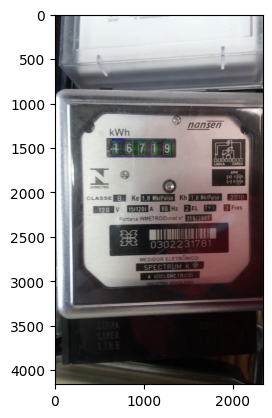

In [ ]:
#show image
import matplotlib.pyplot as plt
plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
plt.show()


In [ ]:
train_path = "training"
test_path  = "testing"
val_path   = "validation"

In [ ]:
import os

def get_image_text_pairs(train_path, img_ext=".jpg", txt_ext=".txt"):
    """
    Collects pairs of image paths and corresponding text paths from a directory.

    Parameters:
        train_path (str): Path to the training directory.
        img_ext (str): Extension of image files (default is ".jpg").
        txt_ext (str): Extension of text files (default is ".txt").

    Returns:
        List of pairs [image_path, text_path].
    """
    pairs = []
    all_files = os.listdir(train_path)

    # Separate image and text files
    image_files = {os.path.splitext(f)[0]: f for f in all_files if f.endswith(img_ext)}
    text_files = {os.path.splitext(f)[0]: f for f in all_files if f.endswith(txt_ext)}

    # Create pairs by matching base filenames
    for base_name, img_file in image_files.items():
        if base_name in text_files:
            img_path = os.path.join(train_path, img_file)
            text_path = os.path.join(train_path, text_files[base_name])
            pairs.append([img_path, text_path])

    return pairs


In [ ]:
import os
all_train = os.listdir(train_path)
all_test  = os.listdir(test_path)
all_val   = os.listdir(val_path)

In [ ]:

# Example usage
train_path = train_path  # Replace with your training directory path
all_train=get_image_text_pairs(train_path)
all_test = get_image_text_pairs(test_path)
all_val  = get_image_text_pairs(val_path)

In [ ]:
print(all_train)

[['training/meter0611.jpg', 'training/meter0611.txt'], ['training/meter0603.jpg', 'training/meter0603.txt'], ['training/meter0570.jpg', 'training/meter0570.txt'], ['training/meter0567.jpg', 'training/meter0567.txt'], ['training/meter0574.jpg', 'training/meter0574.txt'], ['training/meter0590.jpg', 'training/meter0590.txt'], ['training/meter0617.jpg', 'training/meter0617.txt'], ['training/meter0593.jpg', 'training/meter0593.txt'], ['training/meter0613.jpg', 'training/meter0613.txt'], ['training/meter0578.jpg', 'training/meter0578.txt'], ['training/meter0594.jpg', 'training/meter0594.txt'], ['training/meter0615.jpg', 'training/meter0615.txt'], ['training/meter0584.jpg', 'training/meter0584.txt'], ['training/meter0582.jpg', 'training/meter0582.txt'], ['training/meter0577.jpg', 'training/meter0577.txt'], ['training/meter0569.jpg', 'training/meter0569.txt'], ['training/meter0568.jpg', 'training/meter0568.txt'], ['training/meter0674.jpg', 'training/meter0674.txt'], ['training/meter0670.jpg', 

# New Section

In [ ]:
import os

def convert_to_yolo_format(text_file, img_width, img_height):
    """
    Converts bounding box annotations to YOLO format.
    Args:
        text_file (str): Path to the text file.
        img_width (int): Width of the image.
        img_height (int): Height of the image.
    """
    yolo_annotations = []
    with open(text_file, 'r') as f:
        lines = f.readlines()
        for line in lines:
            if "reading" in line:
                digits_label = line.split(": ")[1].strip()
                # print(f'{digits_label=}')
            if "digit" in line:
                # Parse bounding box values
                id = line.split(":")[0].strip().split(" ")[1]
                parts = line.split(":")[1].strip().split()
                x_min, y_min, box_width, box_height = map(int, parts)

                # Convert to YOLO format
                x_center = (x_min + box_width / 2) / img_width
                y_center = (y_min + box_height / 2) / img_height
                norm_width = box_width / img_width
                norm_height = box_height / img_height
                # print(f'{id=}')
                # Append class_id (e.g., 0 for all digits)
                label = digits_label[int(id)-1]
                yolo_annotations.append(f"{label} {x_center} {y_center} {norm_width} {norm_height}")

    return yolo_annotations


In [ ]:
%cd /content/drive/MyDrive/UFPR-AMR Dataset

/content/drive/MyDrive/UFPR-AMR Dataset


In [ ]:
import cv2

def draw_boxes_from_yolo(yolo_data, image_path):
    """
    Draws bounding boxes from YOLO format annotations on the image.
    Args:
        yolo_data (list): List of YOLO annotations (one per line).
        image_path (str): Path to the image.
    """
    # Load the image
    image = cv2.imread(image_path)
    img_height, img_width, _ = image.shape

    for line in yolo_data:
        parts = line.strip().split()
        class_id = int(parts[0])  # The class id (digit)
        x_center = float(parts[1]) * img_width  # Convert to pixel
        y_center = float(parts[2]) * img_height  # Convert to pixel
        box_width = float(parts[3]) * img_width  # Convert to pixel
        box_height = float(parts[4]) * img_height  # Convert to pixel

        # Calculate top-left and bottom-right corners
        x_min = int(x_center - box_width / 2)
        y_min = int(y_center - box_height / 2)
        x_max = int(x_center + box_width / 2)
        y_max = int(y_center + box_height / 2)

        # Draw the rectangle on the image
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)  # Green box with thickness 2

        # Optionally, add class_id or label text on the box
        label = str(class_id)  # You can map this to a label if needed
        cv2.putText(image, label, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    # Display the image with boxes drawn
    cv2_imshow(image)


In [ ]:
img_path="testing/meter1307.jpg"
box_text_path = "testing/meter1307.txt"
import cv2
if not os.path.exists(img_path):
    raise FileNotFoundError(f"Image file not found: {img_path}")
img = cv2.imread(img_path)
height, width, _ = img.shape
yolo_data = convert_to_yolo_format(box_text_path, width, height)

In [ ]:
yolo_data

['1 0.29081196581196583 0.3627403846153846 0.023504273504273504 0.02980769230769231',
 '6 0.3557692307692308 0.3621394230769231 0.03461538461538462 0.02956730769230769',
 '7 0.4164529914529915 0.3625 0.03205128205128205 0.03221153846153846',
 '1 0.47692307692307695 0.3625 0.024786324786324785 0.03076923076923077',
 '9 0.5386752136752136 0.3640625 0.03461538461538462 0.030048076923076924']

In [ ]:
#save
with open(output_path, "w") as out_file:
    out_file.writelines(yolo_data)


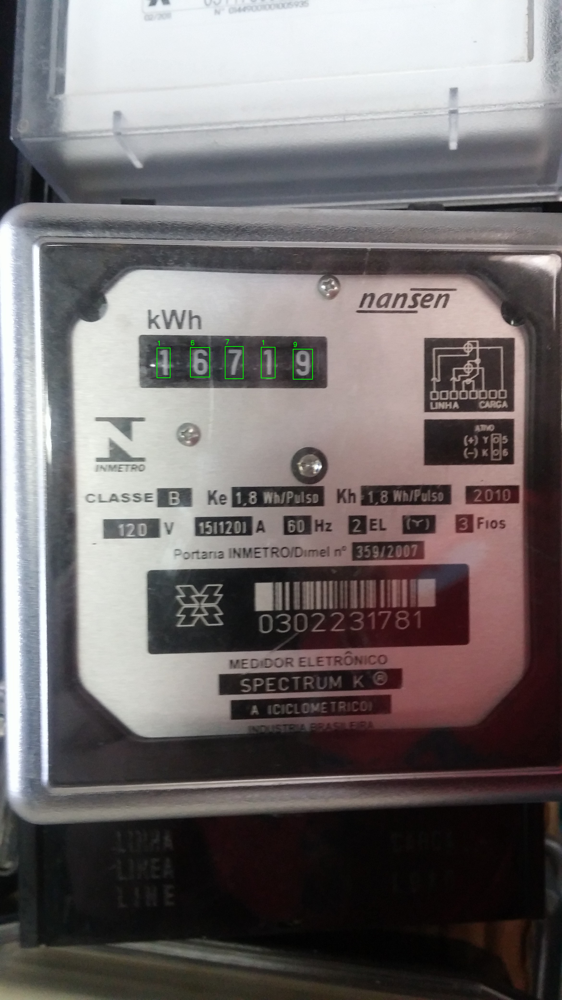

In [ ]:

# Example usage:
yolo_annotations = [
    "0 0.564 0.522 0.119 0.076",  # Example YOLO annotation: class_id, x_center, y_center, norm_width, norm_height
    "1 0.257 0.651 0.090 0.122"
]
# image_path = 'meter_image.jpg'  # Path to your image
draw_boxes_from_yolo(yolo_data, img_path)


In [ ]:
all_train

[['training/meter0611.jpg', 'training/meter0611.txt'],
 ['training/meter0603.jpg', 'training/meter0603.txt'],
 ['training/meter0570.jpg', 'training/meter0570.txt'],
 ['training/meter0567.jpg', 'training/meter0567.txt'],
 ['training/meter0574.jpg', 'training/meter0574.txt'],
 ['training/meter0590.jpg', 'training/meter0590.txt'],
 ['training/meter0617.jpg', 'training/meter0617.txt'],
 ['training/meter0593.jpg', 'training/meter0593.txt'],
 ['training/meter0613.jpg', 'training/meter0613.txt'],
 ['training/meter0578.jpg', 'training/meter0578.txt'],
 ['training/meter0594.jpg', 'training/meter0594.txt'],
 ['training/meter0615.jpg', 'training/meter0615.txt'],
 ['training/meter0584.jpg', 'training/meter0584.txt'],
 ['training/meter0582.jpg', 'training/meter0582.txt'],
 ['training/meter0577.jpg', 'training/meter0577.txt'],
 ['training/meter0569.jpg', 'training/meter0569.txt'],
 ['training/meter0568.jpg', 'training/meter0568.txt'],
 ['training/meter0674.jpg', 'training/meter0674.txt'],
 ['trainin

In [ ]:
from tqdm import tqdm
import cv2
import os
output_dir = "dataset/labels"
all_path =[all_train,all_test,all_val]
for path in tqdm(all_path):
  for img_path, text_path in path:
    img = cv2.imread(img_path)
    height, width, _ = img.shape
    yolo_data = convert_to_yolo_format(text_path, width, height)
    print(yolo_data)
    # draw_boxes_from_yolo(yolo_data, img_path)
    #save yolo data
    output_filename = os.path.splitext(os.path.basename(img_path))[0] + ".txt"
    output_path = os.path.join(output_dir, output_filename)
    print(output_path)
    #write each element as a line
    with open(output_path, 'w') as f:
          f.writelines([line + '\n' for line in yolo_data])

  0%|          | 0/3 [00:00<?, ?it/s]

['7 0.46027131782945735 0.41896802325581395 0.020025839793281652 0.021560077519379845', '3 0.498546511627907 0.4178779069767442 0.022286821705426358 0.02131782945736434', '9 0.5345607235142119 0.4183624031007752 0.02260981912144703 0.020833333333333332', '1 0.5700904392764858 0.4166666666666667 0.016795865633074936 0.017926356589147287', '7 0.6094961240310077 0.4148498062015504 0.021963824289405683 0.020591085271317828']
dataset/labels/meter0611.txt
['1 0.4081072351421189 0.4226017441860465 0.021640826873385012 0.03657945736434109', '2 0.4757751937984496 0.42005813953488375 0.031007751937984496 0.0377906976744186', '3 0.5347222222222222 0.4161821705426357 0.030038759689922482 0.040213178294573645', '2 0.5972222222222222 0.4132751937984496 0.030361757105943153 0.041666666666666664', '6 0.6598837209302325 0.40843023255813954 0.030361757105943153 0.040697674418604654']
dataset/labels/meter0603.txt
['0 0.45978682170542634 0.3172238372093023 0.0229328165374677 0.025436046511627907', '6 0.49

  0%|          | 0/3 [00:02<?, ?it/s]


KeyboardInterrupt: 

# Yolov5

In [ ]:
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 17080, done.
remote: Counting objects: 100% (30/30), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 17080 (delta 20), reused 5 (delta 5), pack-reused 17050 (from 4)
Receiving objects: 100% (17080/17080), 15.70 MiB | 17.27 MiB/s, done.
Resolving deltas: 100% (11721/11721), done.


In [ ]:
%cd /content/drive/MyDrive/UFPR-AMR Dataset


/content/drive/.shortcut-targets-by-id/1JEBz44tAhyiWONi7OdtYCB9Hd3j-d5jf/UFPR-AMR Dataset


In [ ]:
cd yolov5

/content/drive/.shortcut-targets-by-id/1JEBz44tAhyiWONi7OdtYCB9Hd3j-d5jf/UFPR-AMR Dataset/yolov5


In [ ]:
pip install -r requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 904.3/904.3 kB 24.6 MB/s eta 0:00:00


# training

In [ ]:
%cd /content/drive/MyDrive/UFPR-AMR Dataset


/content/drive/.shortcut-targets-by-id/1JEBz44tAhyiWONi7OdtYCB9Hd3j-d5jf/UFPR-AMR Dataset


In [ ]:
%cd yolov5

/content/drive/.shortcut-targets-by-id/1JEBz44tAhyiWONi7OdtYCB9Hd3j-d5jf/UFPR-AMR Dataset/yolov5


In [ ]:
%ls

benchmarks.py    data/             export.py   __pycache__/     requirements.txt  tutorial.ipynb
CITATION.cff     dataset.yaml      hubconf.py  pyproject.toml   runs/             utils/
classify/        detect.py         LICENSE     README.md        segment/          val.py
CONTRIBUTING.md  digit_detection/  models/     README.zh-CN.md  train.py          yolov5s.pt


In [ ]:
!python train.py \
  --img 640 \
  --batch 16 \
  --epochs 50 \
  --data /content/drive/MyDrive/UFPR-AMR\ Dataset/yolov5/dataset.yaml \
  --weights yolov5s.pt \
  --project digit_detection \
  --name exp


Traceback (most recent call last):
  File "/content/drive/.shortcut-targets-by-id/1JEBz44tAhyiWONi7OdtYCB9Hd3j-d5jf/UFPR-AMR Dataset/yolov5/train.py", line 34, in <module>
    import torch
  File "/usr/local/lib/python3.10/dist-packages/torch/__init__.py", line 367, in <module>
    from torch._C import *  # noqa: F403
  File "<frozen importlib._bootstrap>", line 216, in _lock_unlock_module
KeyboardInterrupt
^C


continue traning

In [ ]:
!python train.py \
  --resume /content/drive/MyDrive/UFPR-AMR\ Dataset/yolov5/digit_detection/exp2/weights/last.pt


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-12-29 12:49:19.607107: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-29 12:49:19.628568: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-29 12:49:19.634820: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to regi

plot training

In [ ]:
from IPython.display import Image
Image(filename='/content/drive/MyDrive/UFPR-AMR Dataset/yolov5/digit_detection/exp2/results.png', width=800)


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/UFPR-AMR Dataset/yolov5/digit_detection/exp2/results.png'

In [ ]:
#unasign
from google.colab import runtime
runtime.unassign()

eval

In [ ]:
!python val.py \
  --weights /content/drive/MyDrive/UFPR-AMR\ Dataset/yolov5/digit_detection/exp2/weights/best.pt \
  --data /content/drive/MyDrive/UFPR-AMR\ Dataset/yolov5/dataset.yaml


val: data=/content/drive/MyDrive/UFPR-AMR Dataset/yolov5/dataset.yaml, weights=['/content/drive/MyDrive/UFPR-AMR Dataset/yolov5/digit_detection/exp2/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
fatal: cannot change to '/content/drive/.shortcut-targets-by-id/1JEBz44tAhyiWONi7OdtYCB9Hd3j-d5jf/UFPR-AMR': No such file or directory
YOLOv5 🚀 2024-11-29 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7037095 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/drive/.shortcut-targets-by-id/1JEBz44tAhyiWONi7OdtYCB9Hd3j-d5jf/UFPR-AMR Dataset/dataset/labels/val.cache... 100 images, 0 backgrounds, 0 corrupt: 100% 100/100 [00:00<?, ?it/s]
                 Class     Images  Insta

testing detect

In [ ]:
!python detect.py \
  --weights /content/drive/MyDrive/UFPR-AMR\ Dataset/yolov5/digit_detection/exp2/weights/best.pt \
  --img 640 \
  --conf 0.25 \
  --source /content/drive/MyDrive/UFPR-AMR\ Dataset/dataset/images/test


detect: weights=['/content/drive/MyDrive/UFPR-AMR Dataset/yolov5/digit_detection/exp2/weights/best.pt'], source=/content/drive/MyDrive/UFPR-AMR Dataset/dataset/images/test, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
fatal: cannot change to '/content/drive/.shortcut-targets-by-id/1JEBz44tAhyiWONi7OdtYCB9Hd3j-d5jf/UFPR-AMR': No such file or directory
YOLOv5 🚀 2024-11-29 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7037095 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/101 /content/drive/.shortcut-targets-by-id/1

convert to tensorLite

In [ ]:
#drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/UFPR-AMR Dataset

/content/drive/MyDrive/UFPR-AMR Dataset


In [ ]:
%cd yolov5

/content/drive/MyDrive/UFPR-AMR Dataset/yolov5


In [ ]:
%ls

benchmarks.py    data/             export.py   __pycache__/     requirements.txt  tutorial.ipynb
CITATION.cff     dataset.yaml      hubconf.py  pyproject.toml   runs/             utils/
classify/        detect.py         LICENSE     README.md        segment/          val.py
CONTRIBUTING.md  digit_detection/  models/     README.zh-CN.md  train.py          yolov5s.pt


In [ ]:
!python export.py \
  --weights digit_detection/exp2/weights/best.pt \
  --img 640 \
  --batch 1 \
  --include tflite


export: data=data/coco128.yaml, weights=['digit_detection/exp2/weights/best.pt'], imgsz=[640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, per_tensor=False, dynamic=False, cache=, simplify=False, mlmodel=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tflite']
fatal: cannot change to '/content/drive/.shortcut-targets-by-id/1JEBz44tAhyiWONi7OdtYCB9Hd3j-d5jf/UFPR-AMR': No such file or directory
YOLOv5 🚀 2024-11-29 Python-3.10.12 torch-2.5.1+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7037095 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from digit_detection/exp2/weights/best.pt with output shape (1, 25200, 15) (13.8 MB)
2024-12-29 14:18:42.956889: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already bee

In [ ]:
digit_detection/exp2/weights/best.tflite


# setup interpreter, nms, iou

In [ ]:
#drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pip install tensorflow opencv-python


In [ ]:
%cd /content/drive/MyDrive/UFPR-AMR Dataset

/content/drive/.shortcut-targets-by-id/1JEBz44tAhyiWONi7OdtYCB9Hd3j-d5jf/UFPR-AMR Dataset


In [ ]:
%ls

 dataset/            main.py            output.jpg         script.py             yolov5/
 detections/         mount_and_run.sh   periodic.py        test.py
 digits_detection/  'old stuffs'/      'pi@192.168.1.10'   UI.py
 index.html          output/            raw_output.txt     watchdog_testing.py


In [ ]:
!pip install tflite-runtime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 26.0 MB/s eta 0:00:00


In [ ]:
!pip install tf-nightly

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 634.0/634.0 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 44.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 69.4 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import os

# Path to your TFLite model
model_path = 'yolov5/digit_detection/exp2/weights/best-fp16.tflite'

# Load the TFLite model
interpreter = tf.lite.Interpreter(model_path=model_path)
interpreter.allocate_tensors()

# Get input and output details
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

print("Input details:", input_details)
print("Output details:", output_details)


Input details: [{'name': 'serving_default_keras_tensor_121:0', 'index': 0, 'shape': array([  1, 640, 640,   3], dtype=int32), 'shape_signature': array([  1, 640, 640,   3], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]
Output details: [{'name': 'StatefulPartitionedCall_1:0', 'index': 532, 'shape': array([    1, 25200,    15], dtype=int32), 'shape_signature': array([    1, 25200,    15], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]


In [ ]:
def non_max_suppression(predictions, iou_threshold=0.5):
    """
    Perform Non-Maximum Suppression (NMS) on predictions.
    Args:
        predictions (list of tuples): Each tuple is (class_id, score, x_min, y_min, x_max, y_max).
        iou_threshold (float): IoU threshold for suppression.
    Returns:
        list of tuples: Filtered predictions after NMS.
    """
    # Sort predictions by confidence score in descending order
    predictions = sorted(predictions, key=lambda x: x[1], reverse=True)
    filtered_predictions = []

    while predictions:
        # Pick the box with the highest confidence
        chosen_box = predictions.pop(0)
        filtered_predictions.append(chosen_box)

        # Compare the chosen box with the rest
        predictions = [
            box
            for box in predictions
            if calculate_iou(chosen_box, box) < iou_threshold
        ]

    return filtered_predictions

def calculate_iou(box1, box2):
    """
    Calculate Intersection over Union (IoU) between two boxes.
    Args:
        box1, box2 (tuple): Each tuple is (class_id, score, x_min, y_min, x_max, y_max).
    Returns:
        float: IoU value.
    """
    # Extract coordinates
    _, _, x1_min, y1_min, x1_max, y1_max = box1
    _, _, x2_min, y2_min, x2_max, y2_max = box2

    # Calculate the intersection
    x_inter_min = max(x1_min, x2_min)
    y_inter_min = max(y1_min, y2_min)
    x_inter_max = min(x1_max, x2_max)
    y_inter_max = min(y1_max, y2_max)

    if x_inter_min >= x_inter_max or y_inter_min >= y_inter_max:
        return 0.0

    intersection_area = (x_inter_max - x_inter_min) * (y_inter_max - y_inter_min)

    # Calculate the union
    area1 = (x1_max - x1_min) * (y1_max - y1_min)
    area2 = (x2_max - x2_min) * (y2_max - y2_min)
    union_area = area1 + area2 - intersection_area

    return intersection_area / union_area

In [ ]:
import cv2
import numpy as np

def process_predictions_with_nms(output_data, image, conf_threshold=0.25, iou_threshold=0.5):
    h, w, _ = image.shape
    predictions = []

    # Parse predictions
    for prediction in output_data:
        x_center, y_center, width, height = prediction[:4]
        obj_score = prediction[4]
        class_probs = prediction[5:]

        # Filter by confidence threshold
        if obj_score < conf_threshold:
            continue

        # Convert class probabilities to class ID
        class_id = np.argmax(class_probs)
        class_score = class_probs[class_id]

        # Convert normalized bbox to pixel coordinates
        x_min = int((x_center - width / 2) * w)
        y_min = int((y_center - height / 2) * h)
        x_max = int((x_center + width / 2) * w)
        y_max = int((y_center + height / 2) * h)

        predictions.append((class_id, class_score, x_min, y_min, x_max, y_max))
    print(len(predictions))
    # Apply Non-Maximum Suppression
    filtered_predictions = non_max_suppression(predictions, iou_threshold)

    # Draw the filtered predictions
    for class_id, class_score, x_min, y_min, x_max, y_max in filtered_predictions:
        label = f"Class {class_id}: {class_score:.2f}"
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
        cv2.putText(image, label, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    return image, filtered_predictions



In [ ]:
img_path = '/content/drive/MyDrive/UFPR-AMR Dataset/dataset/images/test/meter1919.jpg' # Corrected image path
img = cv2.imread(img_path)
img_resized = cv2.resize(img, (640, 640))  # Resize to the model's input size
img_normalized = img_resized / 255.0      # Normalize pixel values to [0, 1]
img_expanded = np.expand_dims(img_normalized, axis=0).astype(np.float32)
interpreter.set_tensor(input_details[0]['index'], img_expanded)

In [ ]:
def read_number_from_predictions(predictions):
    """
    Reads a number from predictions by sorting bounding boxes left-to-right.
    Args:
        predictions (list of tuples): Each tuple is (class_id, score, x_min, y_min, x_max, y_max).
    Returns:
        str: The concatenated number as a string.
    """
    # Sort predictions by x_min (left-to-right)
    sorted_predictions = sorted(predictions, key=lambda x: x[2])  # x[2] is x_min
    #calculate the distances of boxes

    # Extract class IDs and concatenate them
    digits = [str(int(class_id)) for class_id, _, _, _, _, _ in sorted_predictions]

    # Return the concatenated number
    return "".join(digits)


# inference tflite

In [ ]:
img_path = '/content/drive/MyDrive/UFPR-AMR Dataset/dataset/images/test/meter1919.jpg' # Corrected image path
# Example usage
# output_data = interpreter.set_tensor(output_details[0]['index'])
img = cv2.imread(img_path)
img_resized = cv2.resize(img, (640, 640))  # Resize to the model's input size
img_normalized = img_resized / 255.0      # Normalize pixel values to [0, 1]
img_expanded = np.expand_dims(img_normalized, axis=0).astype(np.float32)
interpreter.set_tensor(input_details[0]['index'], img_expanded)
interpreter.invoke()
output_data = interpreter.get_tensor(output_details[0]['index'])[0]
image = cv2.imread(img_path)

processed_image, predictions = process_predictions_with_nms(output_data, image)

# Save or display the processed image
cv2.imwrite("output.jpg", processed_image)

110


True

In [ ]:
read_number_from_predictions(predictions)

'3650399174'

In [ ]:
predictions

[(0, 0.9998448, 1510, 964, 1552, 1052),
 (1, 0.9997922, 1716, 959, 1749, 1056),
 (3, 0.9989655, 1233, 3741, 1278, 3839),
 (4, 0.99856937, 1915, 945, 1962, 1051),
 (7, 0.99800783, 1813, 954, 1855, 1050),
 (3, 0.99773574, 1550, 3718, 1598, 3823),
 (9, 0.99405485, 1610, 963, 1654, 1058),
 (5, 0.98189706, 1441, 3732, 1488, 3833),
 (9, 0.981808, 1660, 3716, 1711, 3829),
 (6, 0.92322665, 1334, 3735, 1384, 3834)]

In [ ]:
import numpy as np

def calculate_centroid_from_detection(detection):
    """
    Calculates the centroid of a bounding box from detection input.

    Args:
        detection (tuple): A tuple (index, confidence, x_min, y_min, x_max, y_max).

    Returns:
        tuple: (x_center, y_center) of the box.
    """
    _, _, x_min, y_min, x_max, y_max = detection
    x_center = (x_min + x_max) / 2
    y_center = (y_min + y_max) / 2
    return x_center, y_center

def cluster_detections(detections, distance_threshold=50):
    """
    Clusters detections based on the distance between their centroids.

    Args:
        detections (list of tuples): List of detections with format
                                     (index, confidence, x_min, y_min, x_max, y_max).
        distance_threshold (float): Maximum distance for two boxes to be in the same cluster.

    Returns:
        list of lists: A list where each sublist contains the indices of detections in the same cluster.
    """
    # Calculate centroids of all detections
    centroids = np.array([calculate_centroid_from_detection(detection) for detection in detections])
    n = len(centroids)

    # Initialize clustering
    clusters = []
    visited = set()

    def find_neighbors(index):
        """Finds all neighbors of a given detection index within the distance threshold."""
        neighbors = []
        for j in range(n):
            if j != index and j not in visited:
                dist = np.linalg.norm(centroids[index] - centroids[j])
                if dist <= distance_threshold:
                    neighbors.append(j)
        return neighbors

    # Perform clustering
    for i in range(n):
        if i not in visited:
            # Start a new cluster
            cluster = [i]
            visited.add(i)
            # Queue for BFS-style exploration
            queue = [i]
            while queue:
                current = queue.pop(0)
                neighbors = find_neighbors(current)
                for neighbor in neighbors:
                    if neighbor not in visited:
                        visited.add(neighbor)
                        cluster.append(neighbor)
                        queue.append(neighbor)
            clusters.append(cluster)

    return clusters

# Example input data
detections = [
    (1, 0.9994191, 1419, 777, 1468, 927),
    (0, 0.9984224, 1573, 757, 1646, 900),
    (2, 0.9981544, 1251, 765, 1323, 925),
    (4, 0.9966312, 1736, 740, 1813, 922),
    (9, 0.98111975, 1082, 773, 1155, 918)
]

# Parameters
distance_threshold = 200

# Clustering
clusters = cluster_detections(detections, distance_threshold)


print("Clusters:", clusters)



Clusters: [[0, 1, 2, 3, 4]]


In [ ]:
def extract_numbers_from_clusters(detections, clusters, min_members=3):
    """
    Extracts numbers from clusters with more than the specified number of members.

    Args:
        detections (list of tuples): List of detections with format
                                     (class_id, confidence, x_min, y_min, x_max, y_max).
        clusters (list of lists): Clustered indices of detections.
        min_members (int): Minimum number of members required to process a cluster.

    Returns:
        list: Concatenated numbers (as strings) from the processed clusters.
    """
    results = []
    for cluster in clusters:
        if len(cluster) >= min_members:
            # Sort the cluster indices by x_min (detections[idx][2])
            sorted_predictions = sorted(cluster, key=lambda idx: detections[idx][2])
            # Extract digits (class_id) from sorted detections
            digits = [str(int(detections[idx][0])) for idx in sorted_predictions]
            # Concatenate digits to form the number
            concatenated_number = "".join(digits)
            results.append(concatenated_number)
    return results

# Example input data
detections = predictions
clusters = cluster_detections(detections, distance_threshold)

# Process clusters to extract numbers
results = extract_numbers_from_clusters(detections, clusters, min_members=3)

print(results)


['09174', '36539']


In [ ]:
%cd digits_detection

/content/drive/.shortcut-targets-by-id/1JEBz44tAhyiWONi7OdtYCB9Hd3j-d5jf/UFPR-AMR Dataset/digits_detection


In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import os
import time

# Path to your TFLite model
model_path = '../yolov5/digit_detection/exp2/weights/best-fp16.tflite'

# Load the TFLite model
interpreter = tf.lite.Interpreter(model_path=model_path)
interpreter.allocate_tensors()

# Get input and output details
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

print("Input details:", input_details)
print("Output details:", output_details)
def non_max_suppression(predictions, iou_threshold=0.5):
    """
    Perform Non-Maximum Suppression (NMS) on predictions.
    Args:
        predictions (list of tuples): Each tuple is (class_id, score, x_min, y_min, x_max, y_max).
        iou_threshold (float): IoU threshold for suppression.
    Returns:
        list of tuples: Filtered predictions after NMS.
    """
    # Sort predictions by confidence score in descending order
    predictions = sorted(predictions, key=lambda x: x[1], reverse=True)
    filtered_predictions = []

    while predictions:
        # Pick the box with the highest confidence
        chosen_box = predictions.pop(0)
        filtered_predictions.append(chosen_box)

        # Compare the chosen box with the rest
        predictions = [
            box
            for box in predictions
            if calculate_iou(chosen_box, box) < iou_threshold
        ]

    return filtered_predictions

def calculate_iou(box1, box2):
    """
    Calculate Intersection over Union (IoU) between two boxes.
    Args:
        box1, box2 (tuple): Each tuple is (class_id, score, x_min, y_min, x_max, y_max).
    Returns:
        float: IoU value.
    """
    # Extract coordinates
    _, _, x1_min, y1_min, x1_max, y1_max = box1
    _, _, x2_min, y2_min, x2_max, y2_max = box2

    # Calculate the intersection
    x_inter_min = max(x1_min, x2_min)
    y_inter_min = max(y1_min, y2_min)
    x_inter_max = min(x1_max, x2_max)
    y_inter_max = min(y1_max, y2_max)

    if x_inter_min >= x_inter_max or y_inter_min >= y_inter_max:
        return 0.0

    intersection_area = (x_inter_max - x_inter_min) * (y_inter_max - y_inter_min)

    # Calculate the union
    area1 = (x1_max - x1_min) * (y1_max - y1_min)
    area2 = (x2_max - x2_min) * (y2_max - y2_min)
    union_area = area1 + area2 - intersection_area

    return intersection_area / union_area
def process_predictions_with_nms(output_data, image, conf_threshold=0.25, iou_threshold=0.5):
    h, w, _ = image.shape
    predictions = []

    # Parse predictions
    for prediction in output_data:
        x_center, y_center, width, height = prediction[:4]
        obj_score = prediction[4]
        class_probs = prediction[5:]

        # Filter by confidence threshold
        if obj_score < conf_threshold:
            continue

        # Convert class probabilities to class ID
        class_id = np.argmax(class_probs)
        class_score = class_probs[class_id]

        # Convert normalized bbox to pixel coordinates
        x_min = int((x_center - width / 2) * w)
        y_min = int((y_center - height / 2) * h)
        x_max = int((x_center + width / 2) * w)
        y_max = int((y_center + height / 2) * h)

        predictions.append((class_id, class_score, x_min, y_min, x_max, y_max))
    print('boxes recognized:',len(predictions))
    # Apply Non-Maximum Suppression
    filtered_predictions = non_max_suppression(predictions, iou_threshold)

    # Draw the filtered predictions
    for class_id, class_score, x_min, y_min, x_max, y_max in filtered_predictions:
        label = f"Class {class_id}: {class_score:.2f}"
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
        cv2.putText(image, label, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    return image, filtered_predictions
img_name = input("enter file name with .jpg:")
img_path = 'test/'+img_name # Corrected image path
output_path = "output/"+img_name
# Example usage
# output_data = interpreter.set_tensor(output_details[0]['index'])
img = cv2.imread(img_path)
img_resized = cv2.resize(img, (640, 640))  # Resize to the model's input size
img_normalized = img_resized / 255.0      # Normalize pixel values to [0, 1]
img_expanded = np.expand_dims(img_normalized, axis=0).astype(np.float32)
interpreter.set_tensor(input_details[0]['index'], img_expanded)
interpreter.invoke()
output_data = interpreter.get_tensor(output_details[0]['index'])[0]
image = cv2.imread(img_path)

processed_image, predictions = process_predictions_with_nms(output_data, image)

# Save or display the processed image
cv2.imwrite(output_path, processed_image)
def calculate_centroid_from_detection(detection):
    """
    Calculates the centroid of a bounding box from detection input.

    Args:
        detection (tuple): A tuple (index, confidence, x_min, y_min, x_max, y_max).

    Returns:
        tuple: (x_center, y_center) of the box.
    """
    _, _, x_min, y_min, x_max, y_max = detection
    x_center = (x_min + x_max) / 2
    y_center = (y_min + y_max) / 2
    return x_center, y_center

def cluster_detections(detections, distance_threshold=200):
    """
    Clusters detections based on the distance between their centroids.

    Args:
        detections (list of tuples): List of detections with format
                                     (index, confidence, x_min, y_min, x_max, y_max).
        distance_threshold (float): Maximum distance for two boxes to be in the same cluster.

    Returns:
        list of lists: A list where each sublist contains the indices of detections in the same cluster.
    """
    # Calculate centroids of all detections
    centroids = np.array([calculate_centroid_from_detection(detection) for detection in detections])
    n = len(centroids)

    # Initialize clustering
    clusters = []
    visited = set()

    def find_neighbors(index):
        """Finds all neighbors of a given detection index within the distance threshold."""
        neighbors = []
        for j in range(n):
            if j != index and j not in visited:
                dist = np.linalg.norm(centroids[index] - centroids[j])
                if dist <= distance_threshold:
                    neighbors.append(j)
        return neighbors

    # Perform clustering
    for i in range(n):
        if i not in visited:
            # Start a new cluster
            cluster = [i]
            visited.add(i)
            # Queue for BFS-style exploration
            queue = [i]
            while queue:
                current = queue.pop(0)
                neighbors = find_neighbors(current)
                for neighbor in neighbors:
                    if neighbor not in visited:
                        visited.add(neighbor)
                        cluster.append(neighbor)
                        queue.append(neighbor)
            clusters.append(cluster)

    return clusters


def extract_numbers_from_clusters(detections, clusters, min_members=3):
    """
    Extracts numbers from clusters with more than the specified number of members.

    Args:
        detections (list of tuples): List of detections with format
                                     (class_id, confidence, x_min, y_min, x_max, y_max).
        clusters (list of lists): Clustered indices of detections.
        min_members (int): Minimum number of members required to process a cluster.

    Returns:
        list: Concatenated numbers (as strings) from the processed clusters.
    """
    results = []
    for cluster in clusters:
        if len(cluster) >= min_members:
            # Sort the cluster indices by x_min (detections[idx][2])
            sorted_predictions = sorted(cluster, key=lambda idx: detections[idx][2])
            # Extract digits (class_id) from sorted detections
            digits = [str(int(detections[idx][0])) for idx in sorted_predictions]
            # Concatenate digits to form the number
            concatenated_number = "".join(digits)
            results.append(concatenated_number)
    return results
clusters = cluster_detections(predictions)
result = extract_numbers_from_clusters(predictions, clusters, min_members=3)
print("number recognized: ",result)
txt = img_name.replace("jpg","txt")

f = open("output/"+txt,"w")
f.write("\n".join(result))
f.close()


Input details: [{'name': 'serving_default_keras_tensor_121:0', 'index': 0, 'shape': array([  1, 640, 640,   3], dtype=int32), 'shape_signature': array([  1, 640, 640,   3], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]
Output details: [{'name': 'StatefulPartitionedCall_1:0', 'index': 532, 'shape': array([    1, 25200,    15], dtype=int32), 'shape_signature': array([    1, 25200,    15], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]
enter file name with .jpg:meter1919.jpg
boxes recognized: 110
number recognized:  ['09174', '36539']


In [ ]:
img is None

True